**Introduction**

The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset.

##**Importing necessary dependencies**

In [307]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style="whitegrid", color_codes=True)
pd.set_option('display.max_columns', None)

**Importing Data**

In [308]:
data = pd.read_excel("/content/aspiring_minds_employability_outcomes_2015.xlsx")

In [309]:
data.shape

(3998, 39)

In [310]:
data.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [311]:
# dropping 1st columns from dataset
data.drop("Unnamed: 0", axis=1, inplace=True)

In [312]:
col_names = [ col.lower() for col in data.columns ]

col_names

['id',
 'salary',
 'doj',
 'dol',
 'designation',
 'jobcity',
 'gender',
 'dob',
 '10percentage',
 '10board',
 '12graduation',
 '12percentage',
 '12board',
 'collegeid',
 'collegetier',
 'degree',
 'specialization',
 'collegegpa',
 'collegecityid',
 'collegecitytier',
 'collegestate',
 'graduationyear',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [313]:
data.columns = col_names

In [314]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,3998.0,663794.540520,363218.245829,11244.0000,334284.250000,639600.000000,990480.000000,1.298275e+06
salary,3998.0,307699.849925,212737.499957,35000.0000,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.0000,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.0000,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.0000,66.000000,74.400000,82.600000,9.870000e+01
collegeid,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
collegetier,3998.0,1.925713,0.262270,1.0000,2.000000,2.000000,2.000000,2.000000e+00
collegegpa,3998.0,71.486171,8.167338,6.4500,66.407500,71.720000,76.327500,9.993000e+01
collegecityid,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
collegecitytier,3998.0,0.300400,0.458489,0.0000,0.000000,0.000000,1.000000,1.000000e+00


In [315]:
data.describe(include=['object'])

,dol,designation,jobcity,gender,10board,12board,degree,specialization,collegestate
count,3998,3998,3998,3998,3998,3998,3998,3998,3998
unique,67,419,339,2,275,340,4,46,26
top,present,software engineer,Bangalore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh
freq,1875,539,627,3041,1395,1400,3700,880,915


In [316]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     3998 non-null   int64         
 1   salary                 3998 non-null   int64         
 2   doj                    3998 non-null   datetime64[ns]
 3   dol                    3998 non-null   object        
 4   designation            3998 non-null   object        
 5   jobcity                3998 non-null   object        
 6   gender                 3998 non-null   object        
 7   dob                    3998 non-null   datetime64[ns]
 8   10percentage           3998 non-null   float64       
 9   10board                3998 non-null   object        
 10  12graduation           3998 non-null   int64         
 11  12percentage           3998 non-null   float64       
 12  12board                3998 non-null   object        
 13  col

We can see our dataset consists of :
* 27 Numerical columns
* 9 catogorical columns
* 2 datetime

##**Data Cleaning**

**changing dol column values**

In [442]:
import datetime as dt
data["dol"].replace("present",dt.datetime.today(),inplace=True)
data["dol"] = pd.to_datetime(data["dol"]).dt.date

In [318]:
data['12graduation']=pd.to_datetime(data['12graduation'])
data['graduationyear']=pd.to_datetime(data['graduationyear'])
data['period'] = abs(pd.to_datetime(data["dol"]).dt.year - pd.to_datetime(data['doj']).dt.year)

**Dropping the collegeid,collegecityid and dob columns since they are unnecessary columns for analysis**

In [319]:
data.drop(columns=['id','collegeid','collegecityid','dob'],axis=1,inplace=True)

**finding any null(NaN) values in the dataset**

In [320]:
data.isin([-1, 'NaN']).sum()

salary                      0
doj                         0
dol                         0
designation                 0
jobcity                   461
gender                      0
10percentage                0
10board                     0
12graduation                0
12percentage                0
12board                     0
collegetier                 0
degree                      0
specialization              0
collegegpa                  0
collegecitytier             0
collegestate                0
graduationyear              0
english                     0
logical                     0
quant                       0
domain                    246
computerprogramming       868
electronicsandsemicon    2854
computerscience          3096
mechanicalengg           3763
electricalengg           3837
telecomengg              3624
civilengg                3956
conscientiousness           0
agreeableness               0
extraversion                0
nueroticism                 0
openess_to

**findout  the number of 0's in each  column of dataset**

In [321]:
(data == 0).astype(int).sum(axis=0)

salary                      0
doj                         0
dol                         0
designation                 0
jobcity                     0
gender                      0
10percentage                0
10board                   350
12graduation                0
12percentage                0
12board                   359
collegetier                 0
degree                      0
specialization              0
collegegpa                  0
collegecitytier          2797
collegestate                0
graduationyear              0
english                     0
logical                     0
quant                       0
domain                      0
computerprogramming         0
electronicsandsemicon       0
computerscience             0
mechanicalengg              0
electricalengg              0
telecomengg                 0
civilengg                   0
conscientiousness           0
agreeableness               0
extraversion                0
nueroticism                 0
openess_to

####**Find the outliers in each numerical column**

Salary >10,00,000 is very rare, especially in the first job. So these are considered as outliers and removed.

In [322]:
# row in which value of 'salary less than certian amount
for i in range(1,8):
    seriesObj = data.apply(lambda x: True if x['salary'] <= 250000*i  else False , axis=1)
    # Count number of True in series
    numOfRows = len(seriesObj[seriesObj == True].index)
 
    print('Number of Rows in dataframe in which Salary %d  : '%((250000*i)), numOfRows)

Number of Rows in dataframe in which Salary 250000  :  1710
Number of Rows in dataframe in which Salary 500000  :  3683
Number of Rows in dataframe in which Salary 750000  :  3929
Number of Rows in dataframe in which Salary 1000000  :  3962
Number of Rows in dataframe in which Salary 1250000  :  3975
Number of Rows in dataframe in which Salary 1500000  :  3981
Number of Rows in dataframe in which Salary 1750000  :  3982


In [323]:
indexNames = data[ data['salary'] > 1000000 ].index
 
# Delete these row indexes from dataFrame
data.drop(indexNames , inplace=True)
data.shape

(3962, 35)

**column: 'jobcity'**

In [324]:
data["jobcity"].value_counts()

Bangalore           619
-1                  458
Noida               366
Hyderabad           333
Pune                288
                   ... 
Tirunelvelli          1
Ernakulam             1
Nanded                1
Dharmapuri            1
Asifabadbanglore      1
Name: jobcity, Length: 333, dtype: int64

In [325]:
data['jobcity'].replace(-1,'hyderabad',inplace=True)

In [326]:
for i in data["jobcity"].unique():
  if (i.startswith("H") == True or i.startswith("h") == True):
    print(i)

Hyderabad
hyderabad
Hyderabad 
HYDERABAD
Haridwar
Hissar
Hospete
Hubli
hyderabad(bhadurpally)
hderabad
hyderabad 
Howrah
Haldia
haryana


Here, we findout city names in upper and lower case,we convert it into lower case

In [327]:
city_names =[ i.lower() for i in data["jobcity"]]

In [328]:
data['jobcity'] = city_names

Here,replacing all  MisSpelled city names with correct city names

In [329]:
data.jobcity = data['jobcity'].apply(lambda x : "ambala" if x == "ambala" or x == "ambala city" else
                    
                    "bangalore" if x == "asifabadbanglore" or x=="banglore" or x=="bengaluru" or x == "banagalore" or x == "banaglore" else
                    "bhubaneswar" if x == "bhubaneswar" or x == "bhubaneshwar" or x=="bhubneshwar"else
                    "noida" if x == "ncr" or x == "a-64,sec-64,noida" else
                    "hyderabad" if x == "hderabad" or x=="hyderabad(bhadurpally)"else
                    "kerala" if x == "keral" else
                    "sonipat" if x == "sonepat" else
                    "thiruvananthapuram" if x == "trivandrum" or x == "technopark, trivandrum" else
                    "tirupati" if x == "tirupathi" else
                    "visakhapatnam" if x == "vsakhapttnam" or x=="vizag" else
                    "hyderabad" if x=="-1" else
                    "kolkata" if x == "kolkata`" else x)

In [330]:
popular_cities =data.jobcity.value_counts()[0:20].index.tolist()
print(popular_cities)

['hyderabad', 'bangalore', 'noida', 'pune', 'chennai', 'gurgaon', 'new delhi', 'kolkata', 'mumbai', 'jaipur', 'lucknow', 'bhubaneswar', 'mysore', 'navi mumbai', 'greater noida', 'chandigarh', 'indore', 'coimbatore', 'delhi', 'faridabad']


In [331]:
top_Cities = data[data['jobcity'].isin(popular_cities)]
print(f"Unique cities : {len(data['jobcity'].unique())}")
top_Cities.head()

Unique cities : 237


,salary,doj,dol,designation,jobcity,gender,10percentage,10board,12graduation,12percentage,12board,collegetier,degree,specialization,collegegpa,collegecitytier,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,period
0,420000,2012-06-01,2022-08-23,senior quality engineer,bangalore,f,84.30,"board ofsecondary education,ap",1970-01-01 00:00:00.000002007,95.8,"board of intermediate education,ap",2,B.Tech/B.E.,computer engineering,78.00,0,Andhra Pradesh,1970-01-01 00:00:00.000002011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.3549,-0.4455,10
1,500000,2013-09-01,2022-08-23,assistant manager,indore,m,85.40,cbse,1970-01-01 00:00:00.000002007,85.0,cbse,2,B.Tech/B.E.,electronics and communication engineering,70.06,0,Madhya Pradesh,1970-01-01 00:00:00.000002012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.1076,0.8637,9
2,325000,2014-06-01,2022-08-23,systems engineer,chennai,f,85.00,cbse,1970-01-01 00:00:00.000002010,68.2,cbse,2,B.Tech/B.E.,information technology,70.00,0,Uttar Pradesh,1970-01-01 00:00:00.000002014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.8682,0.6721,8
5,300000,2014-06-01,2022-08-23,system engineer,hyderabad,m,89.92,state board,1970-01-01 00:00:00.000002010,87.0,state board,2,B.Tech/B.E.,electronics and communication engineering,76.32,0,Karnataka,1970-01-01 00:00:00.000002014,560,555,620,-1.000000,645,-1,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.7415,-0.8608,8
6,300000,2014-08-01,2015-05-01,java software engineer,bangalore,m,86.08,state board,1970-01-01 00:00:00.000002010,67.5,state board,2,B.Tech/B.E.,computer science & engineering,72.98,1,Karnataka,1970-01-01 00:00:00.000002014,590,435,380,0.356536,405,-1,346,-1,-1,-1,-1,1.7081,-0.1054,-1.0379,-2.0092,-1.0872,1


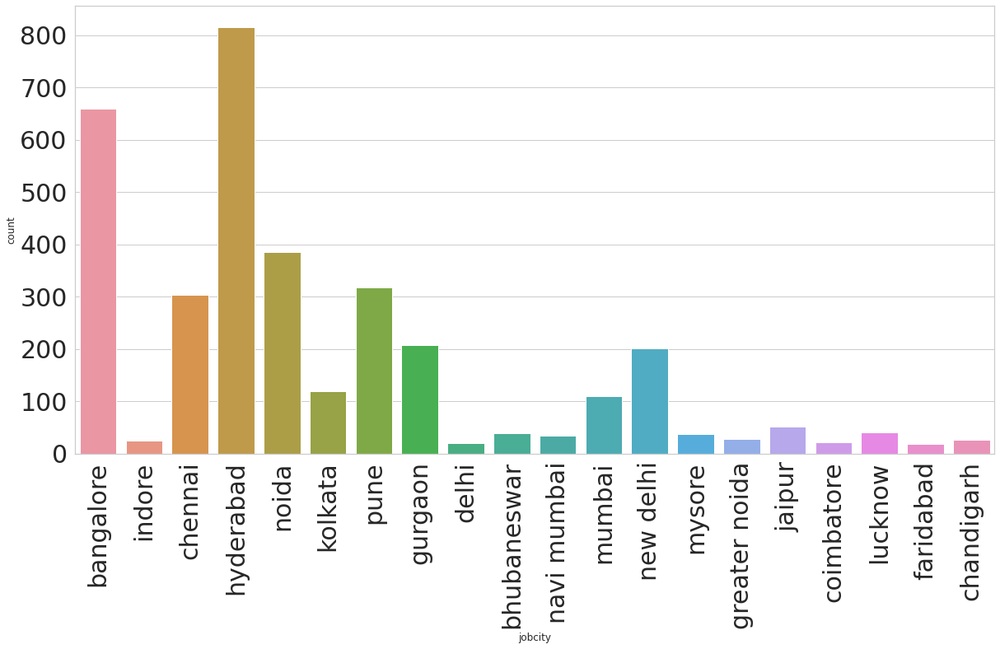

In [332]:
plt.figure(figsize=(20,10))
sns.countplot(x='jobcity',data=top_Cities)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

**column: 'Designation'**

In [333]:
data["designation"].value_counts()

software engineer           538
software developer          264
system engineer             205
programmer analyst          139
systems engineer            118
                           ... 
technical analyst             1
executive engg                1
manual tester                 1
process control engineer      1
jr. software developer        1
Name: designation, Length: 417, dtype: int64

In [334]:
for i in data["designation"].unique():
  if (i.startswith("a")==True or i.startswith("a")==True):
    print(i)

assistant manager
associate software developer
ase
application developer
associate software engineer
assistant system engineer
android developer
assistant software engineer
application engineer
asp.net developer
assistant professor
associate engineer
admin assistant
account executive
associate manager
asst. manager
associate technical operations
assistant systems engineer
associate system engineer
automation engineer
assistant engineer
assistant programmer
associate test engineer
administrative support
administrative coordinator
associate qa
assistant store manager
apprentice
account manager
assistant administrator
associate developer
assistant electrical engineer
assistant system engineer trainee
associate software engg
assistant system engineer - trainee
aircraft technician


In [335]:
data['designation']=data['designation'].apply(lambda x : "associate software engineer" if x == "ase" or x == "associate software engg" or x=="software engineering associate"else
                    
                    "assistant system engineer_trainee" if x == "assistant system engineer trainee" or x=="assistant system engineer - trainee" else
                    "associate software developer" if x == "associate developer" else
                    "assistant system engineer" if x == "assistant systems engineer" else
                    "assistant manager" if x == "asst. manager" else
                    "business system analyst" if x == "business systems analyst" else
                    "junior software engineert" if x == "jr. software engineer" else
                    "junior software developer" if x == "jr. software developer" else
                    "telecommunication engineer" if x == "telecom engineer" else
                    "team lead" if x == "team leader" else
                    "system engineer" if x=="systems engineer" else
                    "quality engineer" if x=="qa engineer" else
                    "quality analyst" if x=="qa analyst" else
                    "quality engineer" if x=="qa engineer" else
                    "operations executive" if x == "operational executive" or x=="operation executive" else x)

Designation Column has 'get' value which is not a desired value.we should clean this and can be imputed with mode of the column

In [336]:
data[data["designation"]=="get"][['designation','jobcity','salary','specialization']]

,designation,jobcity,salary,specialization
4,get,manesar,200000,electronics and communication engineering
332,get,hyderabad,180000,mechanical and automation
350,get,faridabad,340000,electrical engineering
1717,get,hyderabad,145000,mechanical engineering
1897,get,hyderabad,175000,mechanical engineering
2140,get,indore,600000,mechanical engineering
2318,get,lucknow,220000,electronics and electrical engineering
2443,get,kharagpur,110000,mechanical engineering
2666,get,hyderabad,200000,electronics and electrical engineering
2757,get,nashik,350000,mechanical engineering


From here,we can see that most of the people whose designation is unknwon are from mechanical domain(70%) and EEE(30%)

So we can pick the mode of designation for people belonging to mechanical domain and impute it with get value.

similarly for electrical domain

In [337]:
#for people with mechanical engineering,it gives the mode value which will be replaced with the 'get'.

mech = data[data['specialization'].isin(['mechanical engineering','mechanical and automation'])]['designation'].mode()[0]

#for people with electronics and electrical engineering,it gives the mode value which will be replaced with the 'get'.

eee = data[data['specialization']==('electronics and electrical engineering')]['designation'].mode()[0]
print(f'mode for mechanical:  {mech}\nmode for EEE:  {eee}')

mode for mechanical:  assistant manager
mode for EEE:  system engineer


Now we will impute the 'get' of designation with modes of the respective domains

In [338]:
#For mechanical domain
data.loc[data['specialization'].isin(['mechanical engineering','mechanical and automation']),'designation'].replace('get',mech,inplace=True)

#for EEE domain,as all previous get's will be replaced,we can replace the remaining directly without conditions
data['designation'].replace('get',eee,inplace=True)

In [339]:
### Designation
popular_Designation = data['designation'].value_counts()[:20].index.tolist()
print(popular_Designation)

['software engineer', 'system engineer', 'software developer', 'programmer analyst', 'java software engineer', 'software test engineer', 'project engineer', 'technical support engineer', 'senior software engineer', 'java developer', 'test engineer', 'web developer', 'assistant manager', 'quality analyst', 'network engineer', 'associate software engineer', 'application developer', 'data analyst', 'business analyst', 'engineer']


In [340]:
top_Designations = data[data['designation'].isin(popular_Designation)]
print(f"Unique professions : {len(data['designation'].unique())}")
top_Designations.head()

Unique professions : 400


,salary,doj,dol,designation,jobcity,gender,10percentage,10board,12graduation,12percentage,12board,collegetier,degree,specialization,collegegpa,collegecitytier,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,period
1,500000,2013-09-01,2022-08-23,assistant manager,indore,m,85.40,cbse,1970-01-01 00:00:00.000002007,85.0,cbse,2,B.Tech/B.E.,electronics and communication engineering,70.06,0,Madhya Pradesh,1970-01-01 00:00:00.000002012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,9
2,325000,2014-06-01,2022-08-23,system engineer,chennai,f,85.00,cbse,1970-01-01 00:00:00.000002010,68.2,cbse,2,B.Tech/B.E.,information technology,70.00,0,Uttar Pradesh,1970-01-01 00:00:00.000002014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,8
4,200000,2014-03-01,2015-03-01,system engineer,manesar,m,78.00,cbse,1970-01-01 00:00:00.000002008,76.8,cbse,2,B.Tech/B.E.,electronics and communication engineering,73.90,0,Uttar Pradesh,1970-01-01 00:00:00.000002012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,1
5,300000,2014-06-01,2022-08-23,system engineer,hyderabad,m,89.92,state board,1970-01-01 00:00:00.000002010,87.0,state board,2,B.Tech/B.E.,electronics and communication engineering,76.32,0,Karnataka,1970-01-01 00:00:00.000002014,560,555,620,-1.000000,645,-1,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608,8
6,300000,2014-08-01,2015-05-01,java software engineer,bangalore,m,86.08,state board,1970-01-01 00:00:00.000002010,67.5,state board,2,B.Tech/B.E.,computer science & engineering,72.98,1,Karnataka,1970-01-01 00:00:00.000002014,590,435,380,0.356536,405,-1,346,-1,-1,-1,-1,1.7081,-0.1054,-1.0379,-2.00920,-1.0872,1


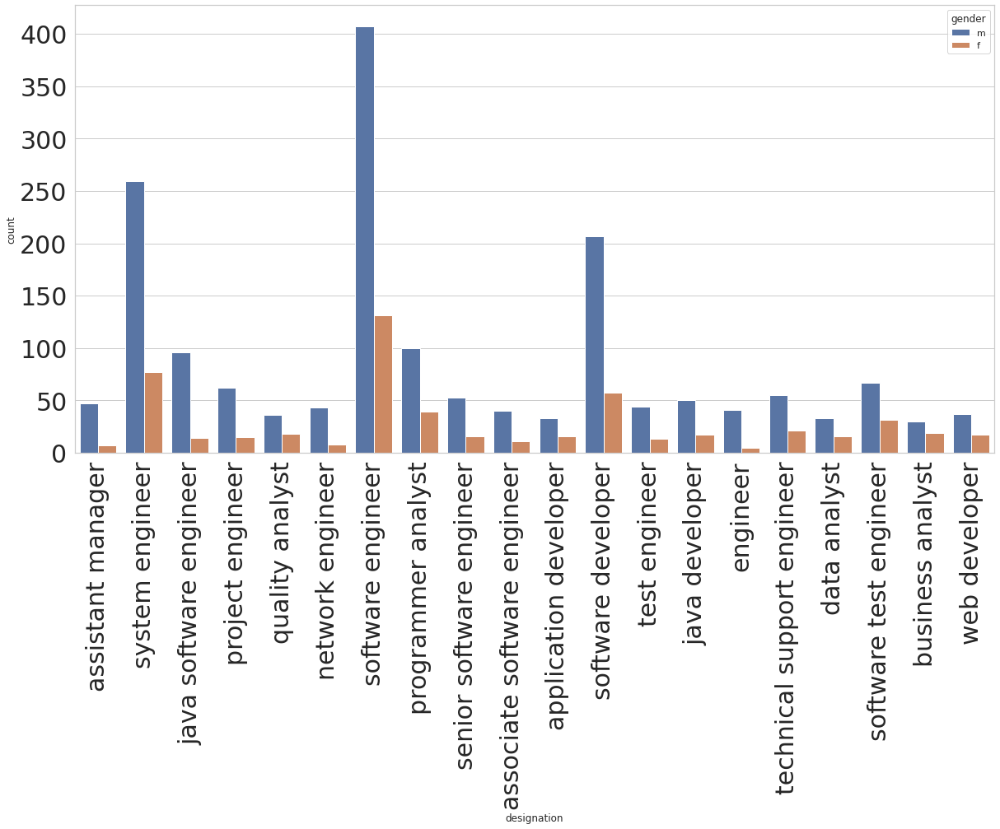

In [341]:
plt.figure(figsize=(20,10))
sns.countplot(x='designation',hue='gender',data=top_Designations)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

**column: '10board'**

This column has missing values in the form of '0'.

In [342]:
data['10board'].unique()

array(['board ofsecondary education,ap', 'cbse', 'state board',
       'mp board bhopal', 'icse',
       'karnataka secondary school of examination', 'up',
       'karnataka state education examination board', 'ssc',
       'kerala state technical education', 0, 'bseb',
       'state board of secondary education, andhra pradesh',
       'matriculation', 'gujarat state board', 'karnataka state board',
       'wbbse', 'maharashtra state board', 'icse board', 'up board',
       'board of secondary education(bse) orissa',
       'little jacky matric higher secondary school',
       'uttar pradesh board', 'bsc,orissa', 'mp board', 'upboard',
       'matriculation board', 'j & k bord', 'rbse',
       'central board of secondary education', 'pseb', 'jkbose',
       'haryana board of school education,(hbse)', 'metric', 'ms board',
       'kseeb', 'stateboard', 'maticulation',
       'karnataka secondory education board', 'mumbai board', 'sslc',
       'kseb', 'board secondary  education', 'mat

In [343]:
board_list = []
for i in data["10board"]:
  if i == 'cbse board' or i=='all india board' or i=='cbese' or i=='cbsc' or i =='cbse,new delhi' or i =='cbse' or i =='cbse[gulf zone]' or i=='central board of secondary education' or i=='central board of secondary education, new delhi':
    board_list.append("CBSE")

  elif i== 'icse' or i == 'isc' or i =='certificate for higher secondary education (chse)orissa' or i=='isc board , new delhi' or i=='isc board' or i =='icse board' or i=='cicse' or i=='ise ' or i=='ise board':
     board_list.append("ICSE")

  else:
    board_list.append("STATE BOARD")


In [344]:
data['10board'] = board_list

In [345]:
data['10board'].value_counts()

STATE BOARD    2280
CBSE           1403
ICSE            279
Name: 10board, dtype: int64

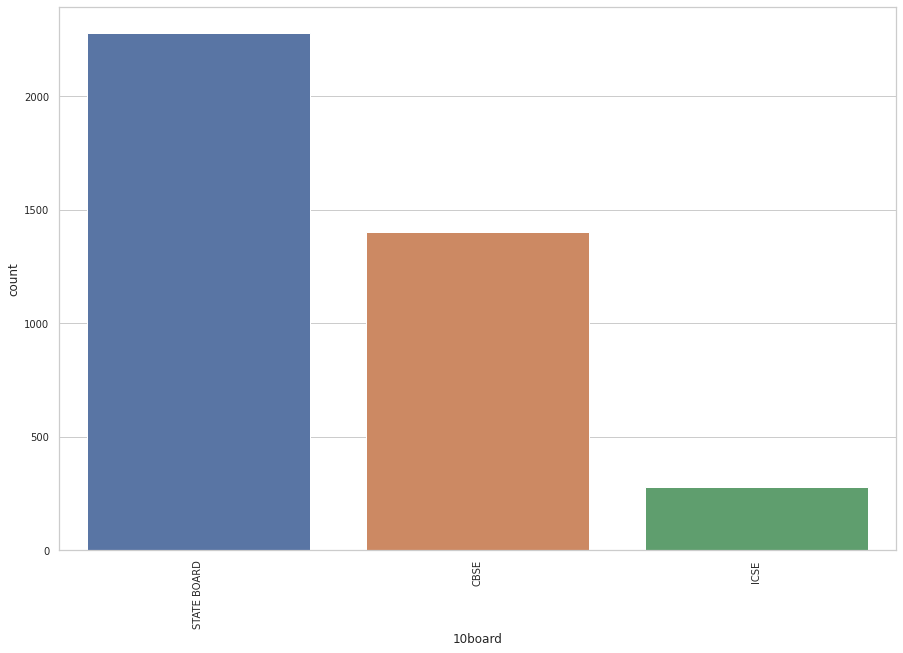

In [346]:
plt.figure(figsize=(15,10))
sns.countplot(x='10board',data=data)
plt.xticks(fontsize=10,rotation=90)
plt.yticks(fontsize=10)
plt.show()

**column: '12board'**

One hot ecoding for 12board column

In [347]:
data['12board'].unique()

array(['board of intermediate education,ap', 'cbse', 'state board',
       'mp board', 'isc', 'icse', 'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 0, 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc', 'isc board',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'isce', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate sta

In [348]:
board_list2 = []
for i in data["12board"]:
  if i=='cbse'or i=='all india board' or i=='central board of secondary education, new delhi' or i== 'cbese':
    board_list2.append("CBSE")

  elif i=='isc' or i=='icse'or i=='aissce'or i=='isc board' or i=='isce'or i=='cicse' or i=='isc board , new delhi':
    board_list2.append("ICSE")
  else:
    board_list2.append("STATE BOARD")

In [349]:
data["12board"]=board_list2

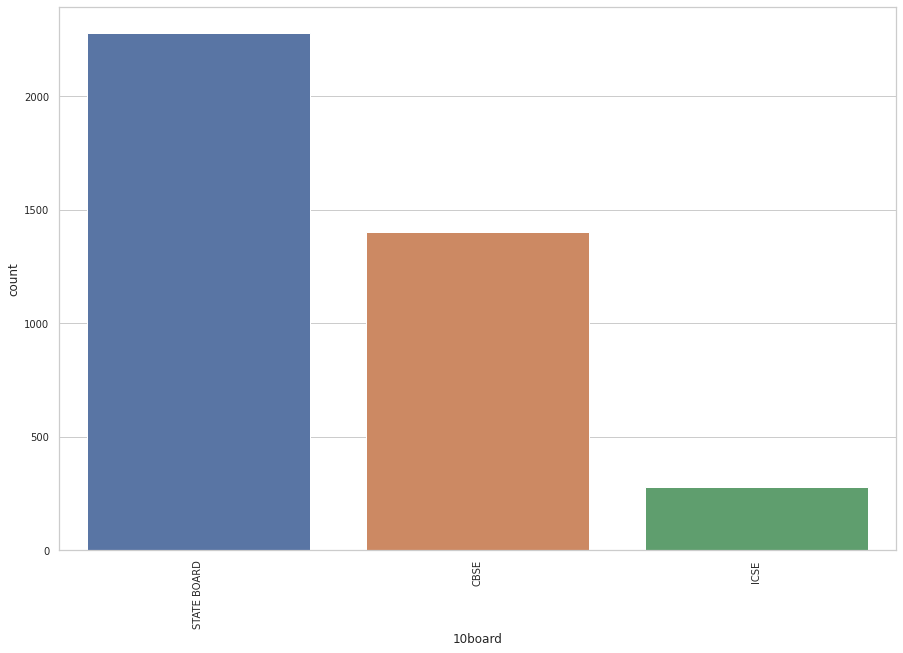

In [350]:
plt.figure(figsize=(15,10))
sns.countplot(x='10board',data=data)
plt.xticks(fontsize=10,rotation=90)
plt.yticks(fontsize=10)
plt.show()

In [351]:
data["12board"].value_counts()

STATE BOARD    2394
CBSE           1392
ICSE            176
Name: 12board, dtype: int64

**Column : 'Domain'**

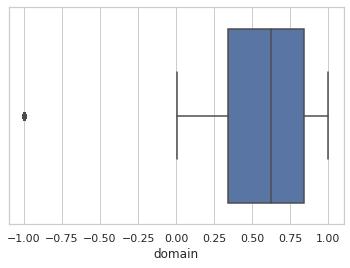

In [352]:
sns.boxplot(x='domain',data=data)
plt.show()

This column has missing values in form of -1 and column looks standardized.We can use general mean/median/mode to impute the missing value

In [353]:
data['domain'].replace(-1,data['domain'].median(),inplace=True)

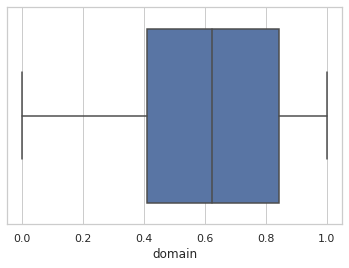

In [354]:
sns.boxplot(x='domain',data=data)
plt.show()

**Column: 'Specialization'**

In [355]:
specialization_codes = \
{'electronics and communication engineering' : 'ECE',
 'computer science & engineering' : 'CSE',
 'information technology' : 'IT' ,
 'computer engineering' : 'CS',
 'computer application' : 'CA',
 'mechanical engineering' : 'ME',
 'electronics and electrical engineering' : 'EEE',
 'electronics & telecommunications' : 'ECE',
 'electrical engineering' : 'EEE',
 'electronics & instrumentation eng' : 'ECE',
 'civil engineering' : 'CE',
 'electronics and instrumentation engineering' : 'ECE',
 'information science engineering' : 'IT',
 'instrumentation and control engineering' : 'EC',
 'electronics engineering' : 'ECE',
 'biotechnology' : 'other',
 'other' : 'other',
 'industrial & production engineering' : 'other',
 'chemical engineering' : 'other',
 'applied electronics and instrumentation' : 'ECE',
 'computer science and technology' : 'CS',
 'telecommunication engineering' : 'ECE',
 'mechanical and automation' : 'ME',
 'automobile/automotive engineering' : 'ME',
 'instrumentation engineering' : 'ECE',
 'mechatronics' : 'ME',
 'electronics and computer engineering' : 'ECS',
 'aeronautical engineering' : 'ME',
 'computer science' : 'CS',
 'metallurgical engineering' : 'other',
 'biomedical engineering' : 'other',
 'industrial engineering' : 'other',
 'information & communication technology' : 'ECE',
 'electrical and power engineering' : 'EL',
 'industrial & management engineering' : 'other',
 'computer networking' : 'CS',
 'embedded systems technology' : 'ECE',
 'power systems and automation' : 'EL',
 'computer and communication engineering' : 'CS',
 'information science' : 'IT',
 'internal combustion engine' : 'ME',
 'ceramic engineering' : 'other',
 'mechanical & production engineering' : 'ME',
 'control and instrumentation engineering' : 'ECE',
 'polymer technology' : 'other',
  'electronics' : 'ECE'}

In [356]:
data['specialization'] = data['specialization'].map(specialization_codes)

In [357]:
data['specialization'].unique()

array(['CS', 'ECE', 'IT', 'CSE', 'ME', 'EEE', 'EC', 'CA', 'ECS', 'CE',
       'other', 'EL'], dtype=object)

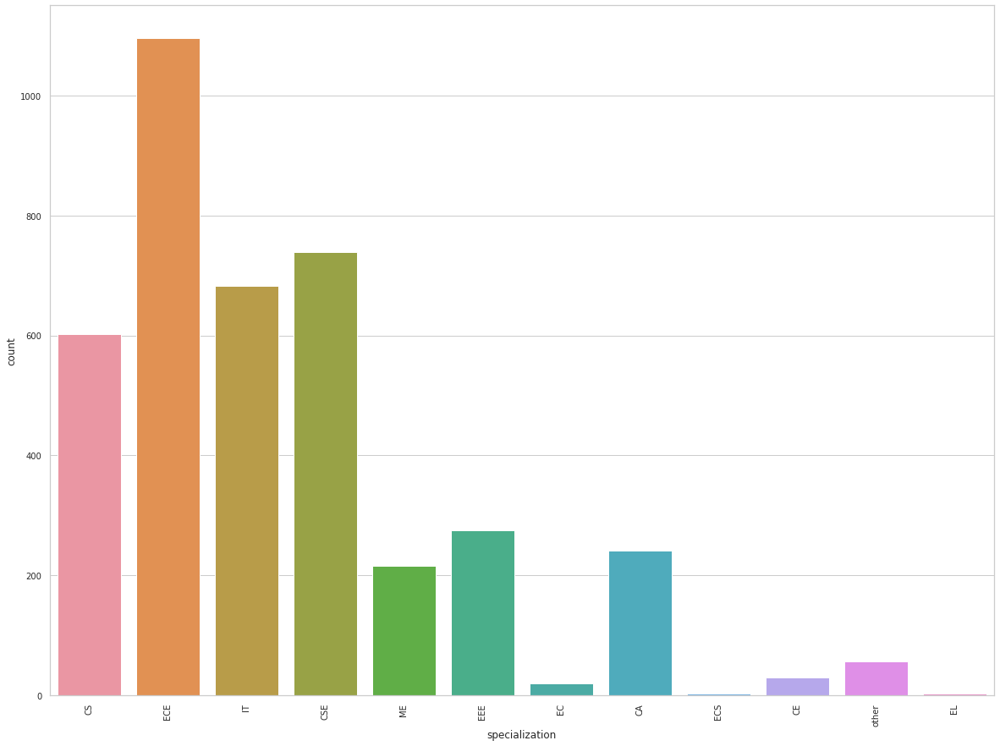

In [358]:
plt.figure(figsize=(20,15))
sns.countplot(x='specialization',data=data)
plt.xticks(fontsize=10,rotation=90)
plt.yticks(fontsize=10)
plt.show()

In [359]:
data['specialization'].value_counts()

ECE      1096
CSE       739
IT        683
CS        602
EEE       275
CA        241
ME        216
other      56
CE         29
EC         19
ECS         3
EL          3
Name: specialization, dtype: int64

In [360]:
data.columns

Index(['salary', 'doj', 'dol', 'designation', 'jobcity', 'gender',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'collegetier', 'degree', 'specialization', 'collegegpa',
       'collegecitytier', 'collegestate', 'graduationyear', 'english',
       'logical', 'quant', 'domain', 'computerprogramming',
       'electronicsandsemicon', 'computerscience', 'mechanicalengg',
       'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience',
       'period'],
      dtype='object')

##**DATA VISUALIZATION**

In [444]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3962 entries, 0 to 3997
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   salary                 3962 non-null   int64         
 1   doj                    3962 non-null   datetime64[ns]
 2   dol                    3962 non-null   object        
 3   designation            3962 non-null   object        
 4   jobcity                3962 non-null   object        
 5   gender                 3962 non-null   object        
 6   10percentage           3962 non-null   float64       
 7   10board                3962 non-null   object        
 8   12graduation           3962 non-null   datetime64[ns]
 9   12percentage           3962 non-null   float64       
 10  12board                3962 non-null   object        
 11  collegetier            3962 non-null   int64         
 12  degree                 3962 non-null   object        
 13  spe

Data divided into numerical and categorical and datetime 

In [362]:
category_data=data.select_dtypes(include=['object'])
numeric_data = data.select_dtypes(include=['int64','float64'])

In [363]:
datetime_data = data.select_dtypes(include=['datetime64[ns]'])

In [443]:
datetime_data.columns

Index(['doj', '12graduation', 'graduationyear'], dtype='object')

####**Univariant Analysis**

**PDF and Histograms**

In [381]:
def pdf_data(column):
  mini = numeric_data[column].min()
  maxi = numeric_data[column].max()
  ran = numeric_data[column].max()-numeric_data[column].min()
  mean = numeric_data[column].mean()
  median = numeric_data[column].median()
  st_dev = numeric_data[column].std()
  skew = numeric_data[column].skew()
  kurtosis = numeric_data[column].kurt()

  # calculating points of standard deviation
  points = mean-st_dev, mean+st_dev

  sns.distplot(numeric_data[column],hist=True, kde=True)

  sns.lineplot(points, [0,0], color = 'black', label = "std_dev")
  sns.scatterplot([mini,maxi], [0,0], color = 'orange', label = "min/max")
  plt.axvline(mean,color='red',label='mean')
  sns.scatterplot([median], [0], color = 'blue', label = "median")
  plt.xlabel('{}'.format(column), fontsize = 20)
  plt.ylabel('density')
  plt.title('std_dev = {}; \nskew = {}; \nkurtosis = {}; \nrange = {}; \nmean = {}; \nmedian = {}'.format((round(points[0],2),round(points[1],2)),

                                                                                                  round(skew,2),
                                                                                                  round(kurtosis,2),
                                                                                                  (round(mini,2),round(maxi,2),round(ran,2)),
                                                                                                  round(mean,2),
                                                                                                  round(median,2)))

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/lo

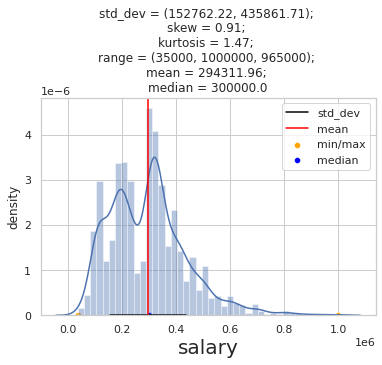

In [382]:
pdf_data('salary')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/lo

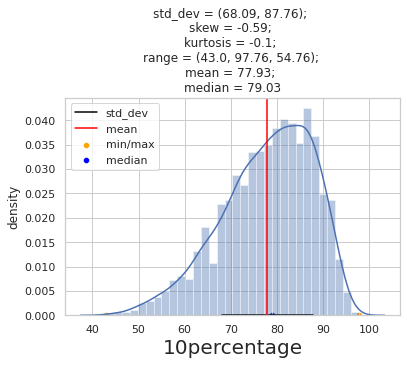

In [385]:
pdf_data('10percentage')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/lo

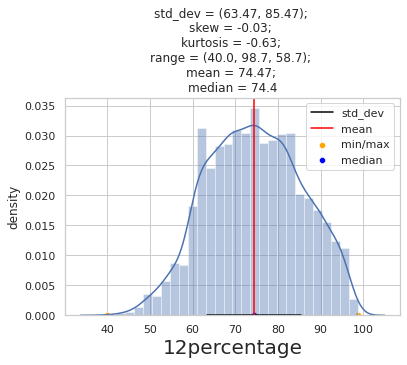

In [386]:
pdf_data('12percentage')

In [391]:
numeric_data.columns

Index(['salary', '10percentage', '12percentage', 'collegetier', 'collegegpa',
       'collegecitytier', 'english', 'logical', 'quant', 'domain',
       'computerprogramming', 'electronicsandsemicon', 'computerscience',
       'mechanicalengg', 'electricalengg', 'telecomengg', 'civilengg',
       'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience', 'period'],
      dtype='object')

In [392]:
pdf_data=('collegegpa')

In [393]:
pdf_data=('period')

**Histograms**

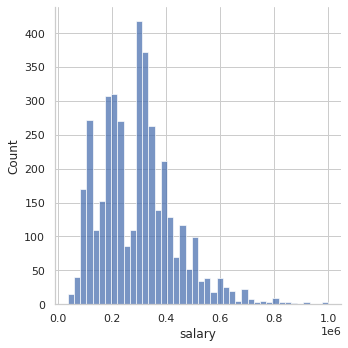

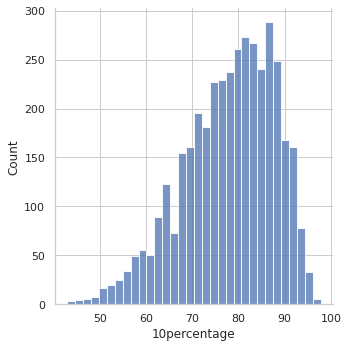

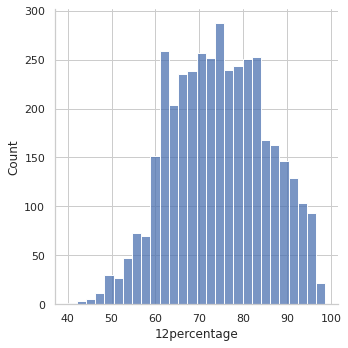

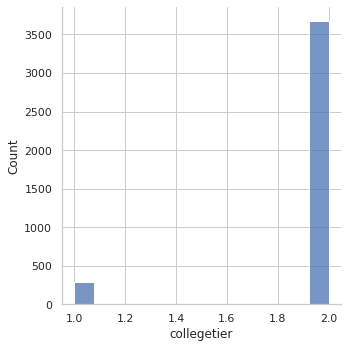

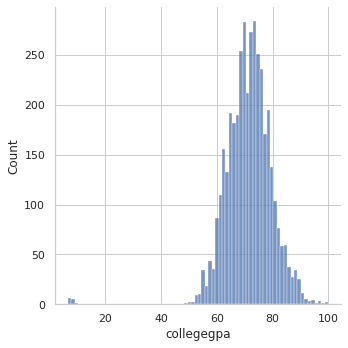

...

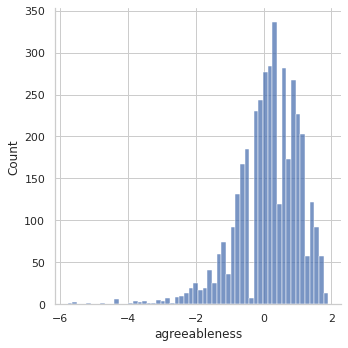

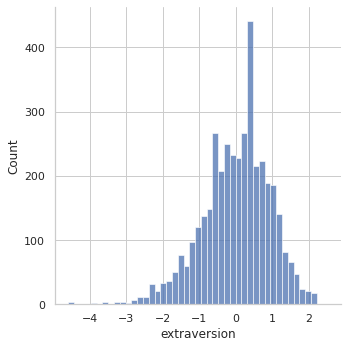

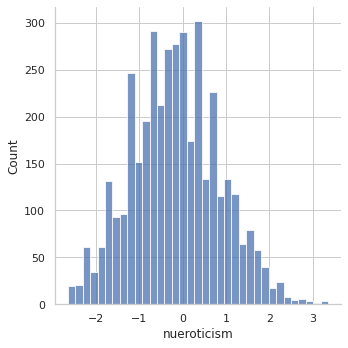

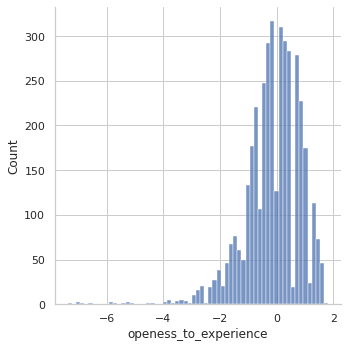

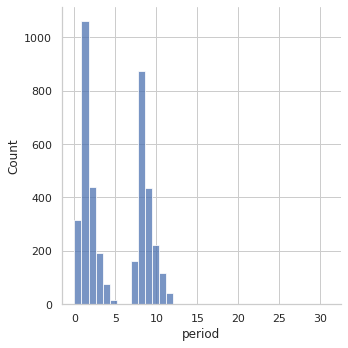

In [399]:
for i in numeric_data:
  sns.displot(x=i,data=numeric_data)
  plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


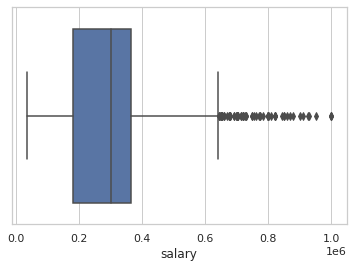

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


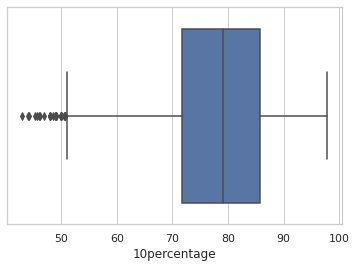

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


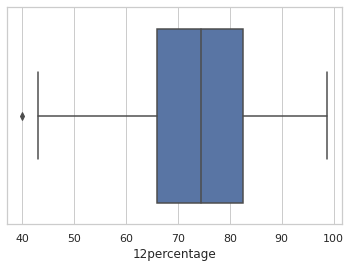

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


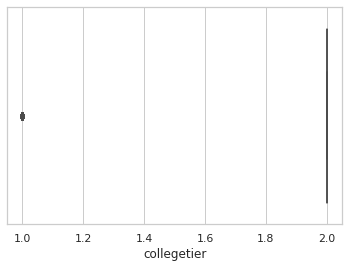

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


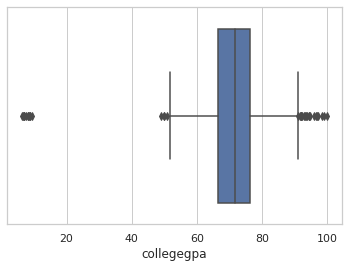

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


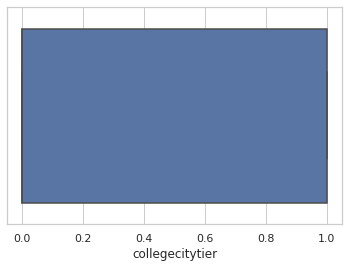

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


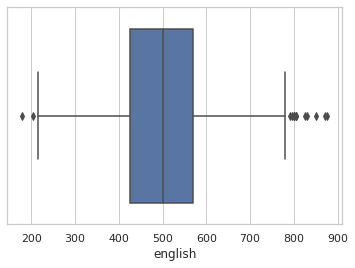

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


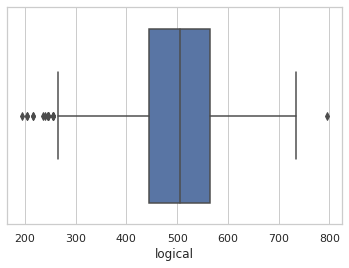

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


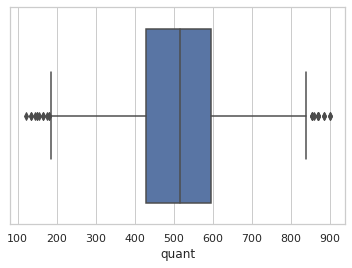

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


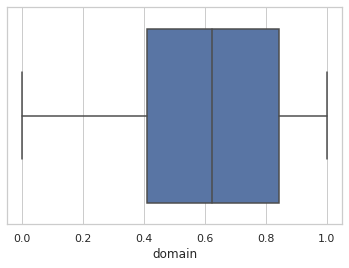

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


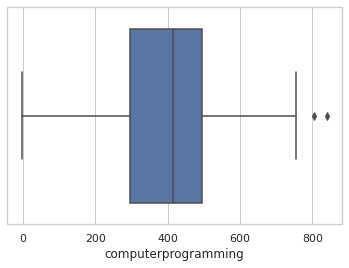

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


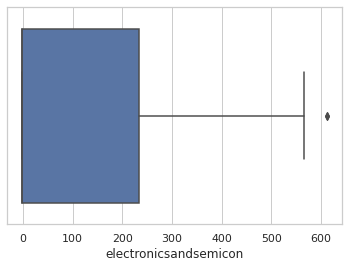

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


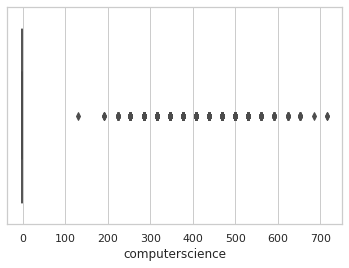

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


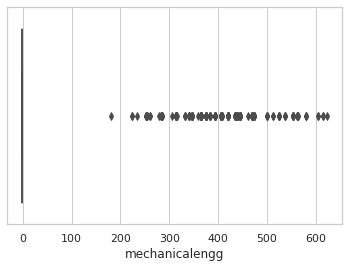

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


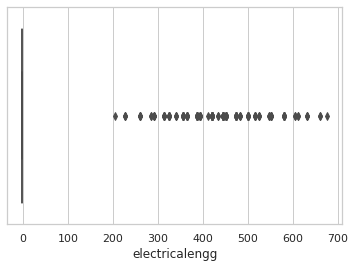

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


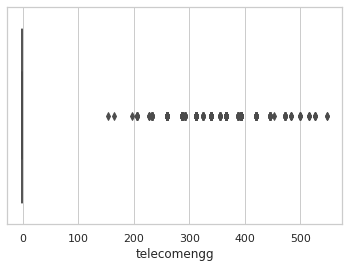

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


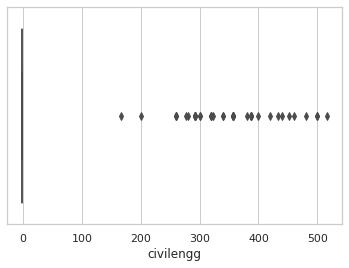

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


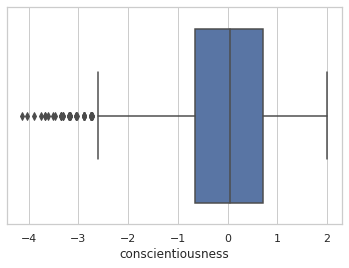

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


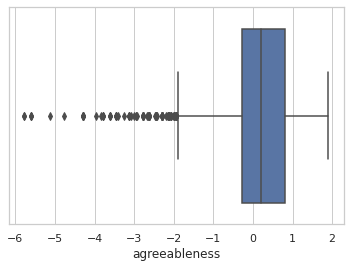

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


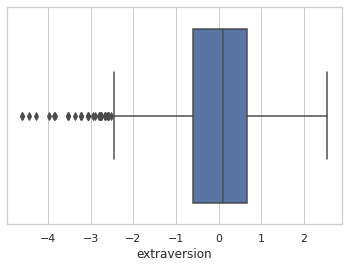

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


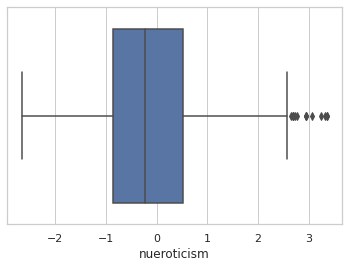

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


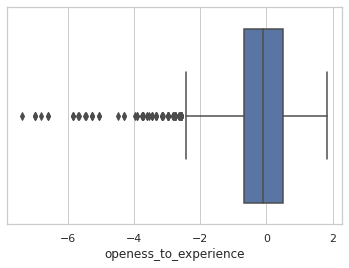

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


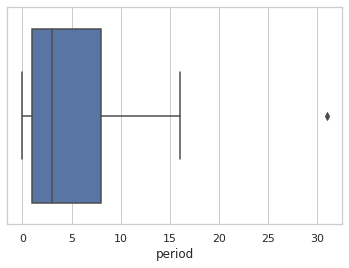

In [395]:
for i in numeric_data.columns:
  sns.boxplot(numeric_data[i].dropna())
  plt.show()

###**Bivariant Analysis**

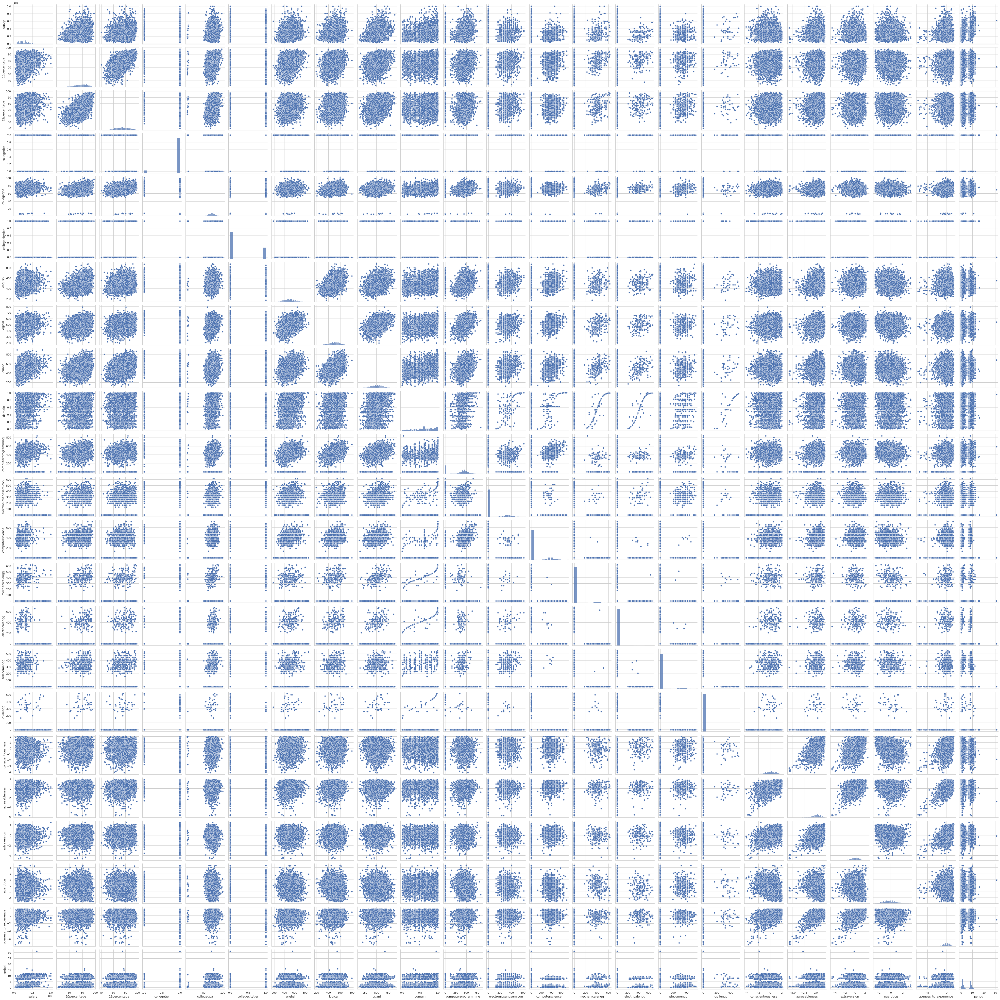

In [400]:
sns.pairplot(data)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 1080x360 with 0 Axes>

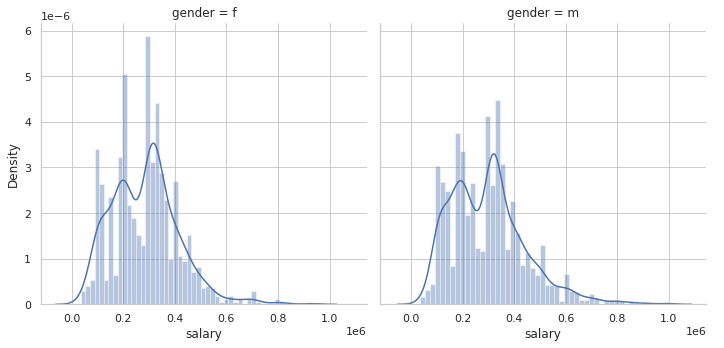

In [404]:
plt.figure(figsize=(15,5))
colors = sns.color_palette('bright',n_colors=2)
sns.FacetGrid(data, col="gender", size=5,palette=colors) \
   .map(sns.distplot, "salary",bins=50) \
   .add_legend()
plt.show()

* We can observe that the salary data is right skewed
* We can also see that the distributions are quite similar for male and female in the range below 10lakhs.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


m    3012
f     950
Name: gender, dtype: int64


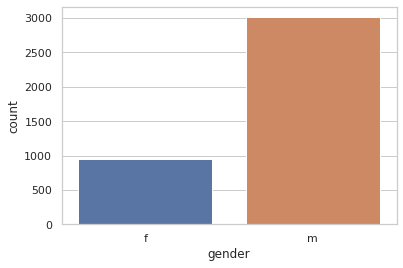

In [406]:
sns.countplot(data['gender'])
print(data['gender'].value_counts())

* The ratio of m/f is 3.19 indicates there are 3 times more men than women employed

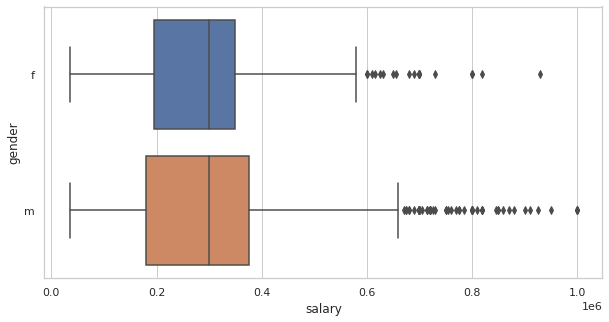

In [408]:
plt.figure(figsize=(10,5))
sns.boxplot(x='salary',y='gender',data=data)

* It is noted that there are many outliers in the salary data
* There is not much difference between median salary for both genders.
* We can also observe male have more outliers indicating they are more people getting higher pays in male than female category

Text(0.5, 0.98, 'salary levels by specialization')

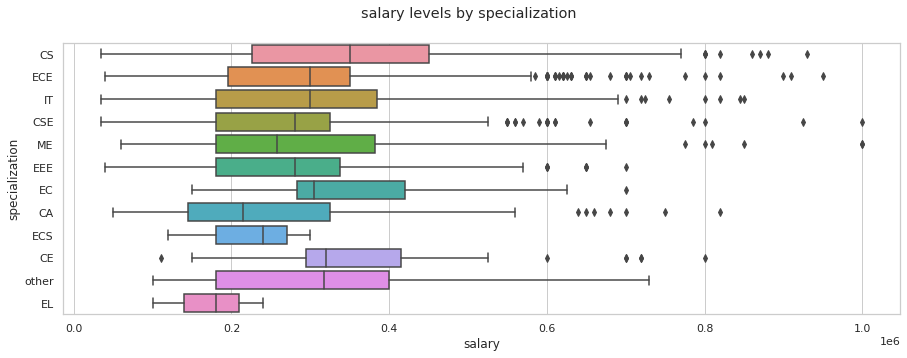

In [410]:
plt.figure(figsize=(15,5))
sns.boxplot(x='salary',y='specialization',data=data)
plt.suptitle('salary levels by specialization')

* Median salary of people from all specializations are nearly similar.
* We can see there are more people getting higher pays who have specialization in CSE/ECE compared to others.

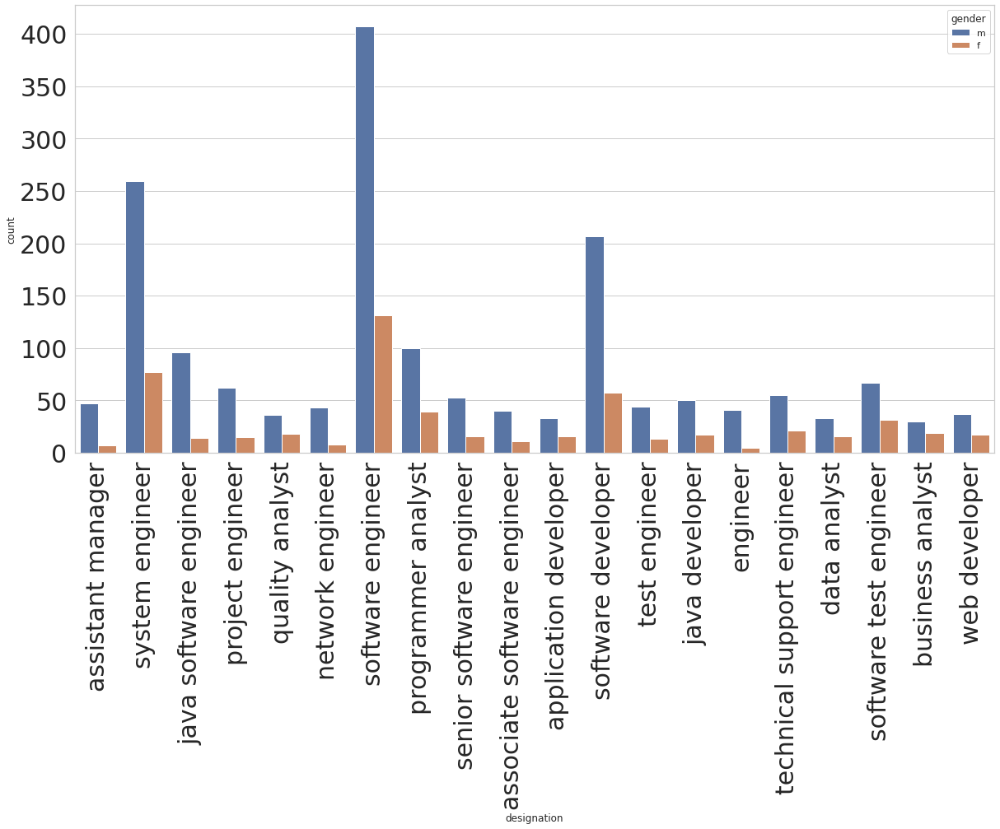

In [412]:
plt.figure(figsize=(20,10))
sns.countplot(x='designation',hue='gender',data=top_Designations)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

* All the general professions are more dominated by the males as we can there is considerable difference of frequency for every role.
* Here we took the most common roles taken by the amcat aspirants which are mostly 'IT Roles'.
* from the below plot,we can understand the reason for most 'IT roles' might be because of Specialization.

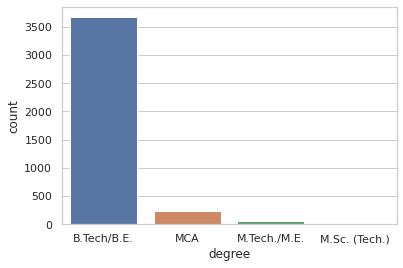

In [416]:
sns.countplot(x = 'degree',data=data)

* Most of the Amcat aspirants are from Btech domain

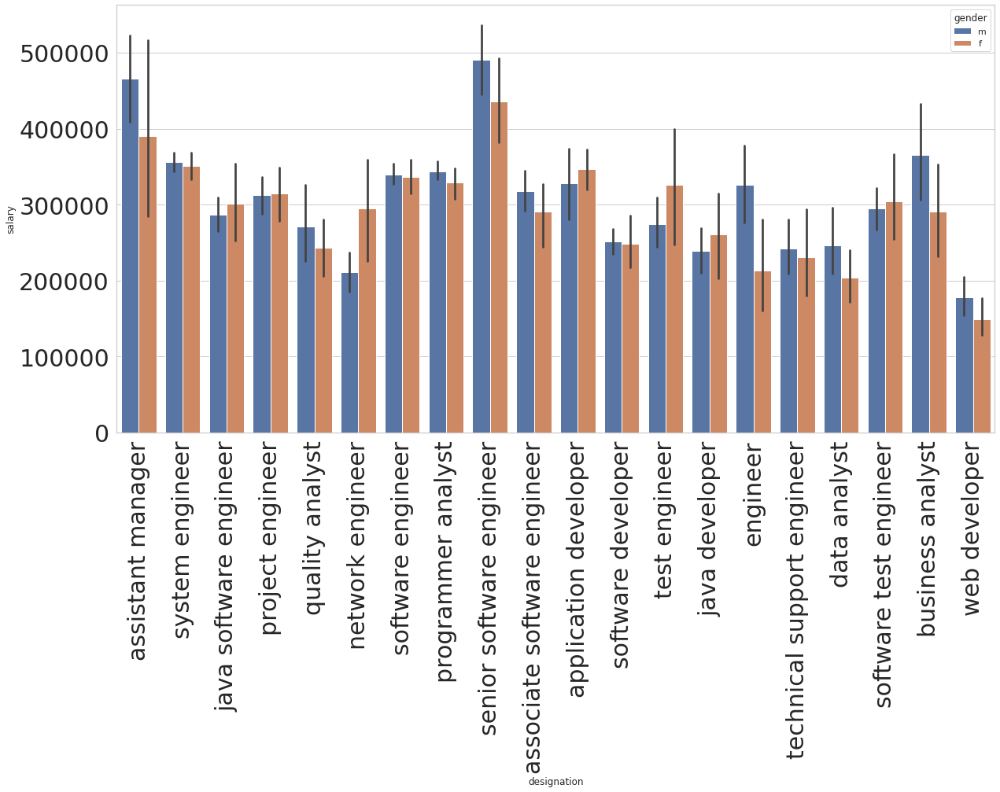

In [417]:
plt.figure(figsize=(20,10))
sns.barplot(x='designation',y='salary',hue='gender',data=top_Designations)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

* mean salary of top most frequent roles is nearly independent of gender.
* there is some considerable difference in some roles.but we cannot be sure that women is being paid less in that role
* it might be due to experience,specialization etc.

In [420]:
### Now lets us see the high paying designations and their relation with respect to gender
high = list(data.sort_values("salary",ascending=False)["designation"].unique())[:20]
high_pay = data[data['designation'].isin(high)]

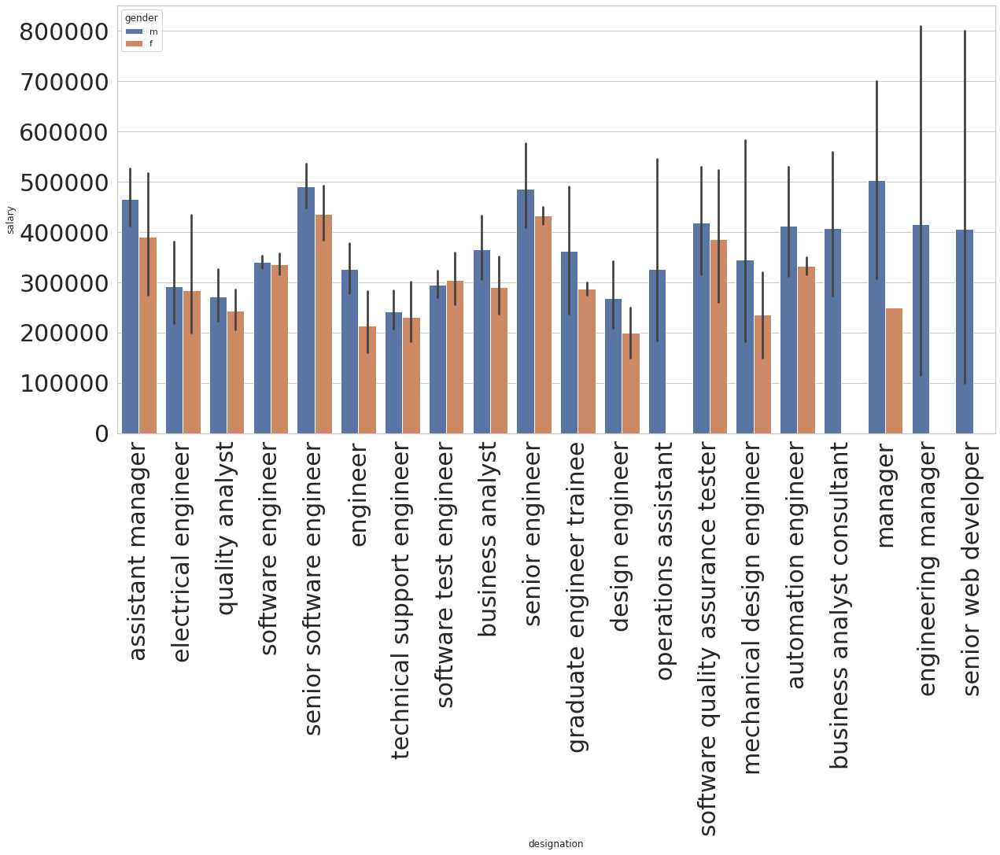

In [421]:
plt.figure(figsize=(20,10))
sns.barplot(x='designation',y='salary',hue='gender',data=high_pay)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

* Most of the high paying jobs are from IT domain.
* In 45% of top paying roles,men are generally paid higher compared to women.
* In 20% of top paying roles,women are paid higher than men
* In roles like junior manager,sales account manager,software engineer trainee there are no women working in these fields.

* The disperancy between pay based on gender might be because of other features like experience,specialization etc.
* Software Enginner and Software developer are most frequent and highest paying jobs

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


For Whole dataset
gender
f    5.300366
m    5.408187
Name: period, dtype: float64
********************
For High_paying jobs
gender
f    4.891579
m    4.786521
Name: period, dtype: float64


<Figure size 1440x360 with 0 Axes>

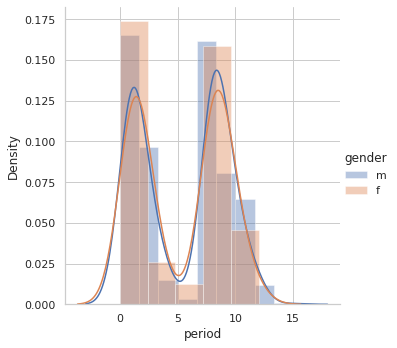

In [423]:
### Lets us check experience distribution of both male and female
plt.figure(figsize=(20,5))

sns.FacetGrid(high_pay, hue="gender",size=5) \
   .map(sns.distplot, "period") \
   .add_legend()
print('For Whole dataset')
print(high_pay.groupby('gender').period.mean())
print('*'*20)
print('For High_paying jobs')
print(data.groupby('gender').period.mean())

* It is a Bi-Modal Districution
* Average Experience of male is around 5years and for women it is around 4 and half years.

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


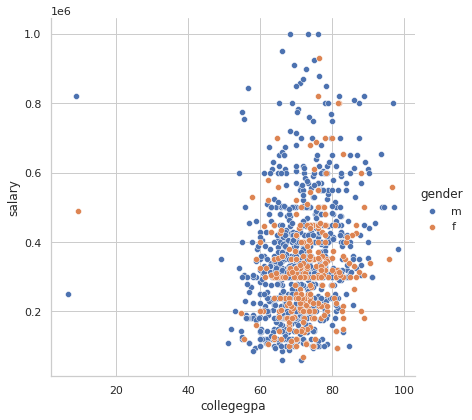

In [428]:
sns.FacetGrid(data=high_pay,hue='gender',size=6) \
    .map(sns.scatterplot,'collegegpa','salary') \
    .add_legend()

* Most of men and women have cgpa around 70-75 which is a good range.
* There is no relation that having high or low gpa being men/women is effecting the salary
* so we can conclude this is not the reason for women being paid less as both distributions overlap extensively

**Correlation Matrix**

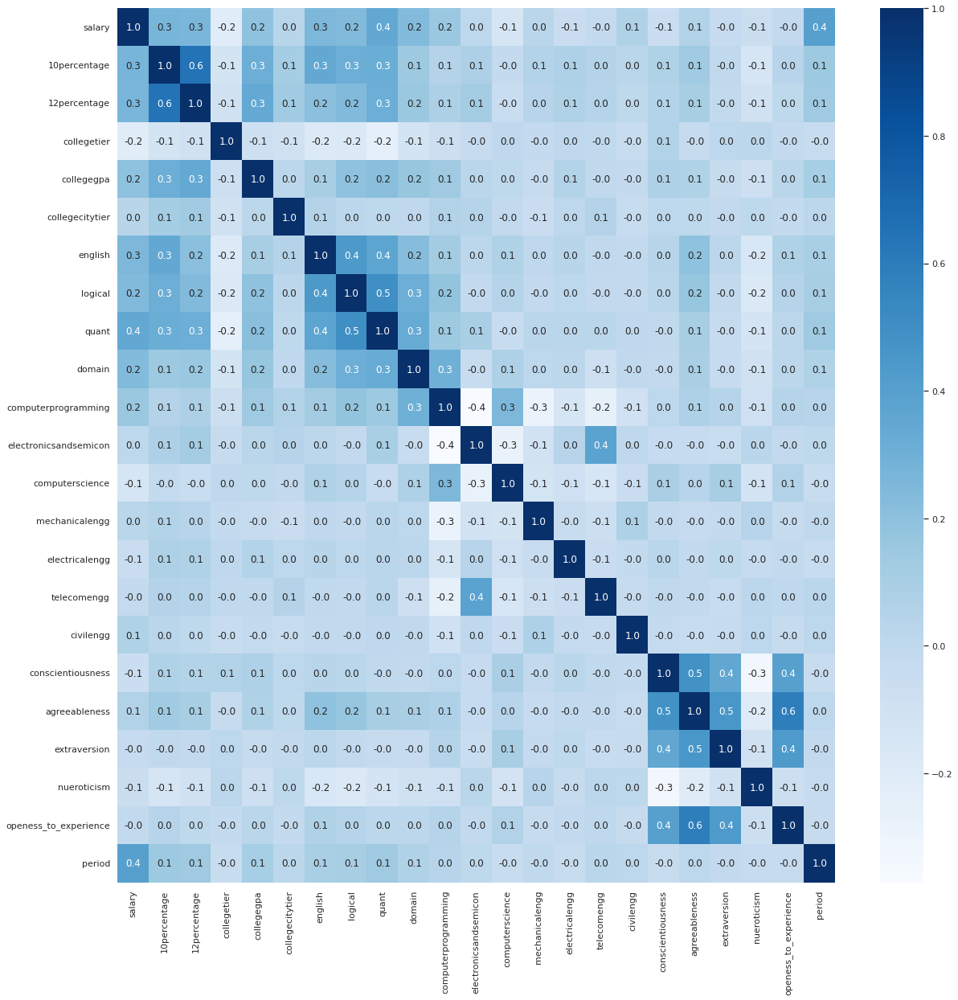

In [401]:
# constructing a heat map to visualize the correlation matrix
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(), cbar=True, fmt='.1f', annot=True, cmap='Blues')
plt.savefig('Correlation Heat map')

* Correlation Matrix reveal that very few features are highly correlated.

####**Overall Conclusions:**
1. Most of Amcat Aspirants are male working in IT domain with an experience of around 5years with degree in Btech and specialization in Computer Science/Information Technology from tier-2 college in uttarpradesh with an average salary around 300k.
2. Highpaying jobs taken up by amcat aspirants are mostly from 'IT' Domain.
3. Software Engineer and Software Developer are the most aimed profession for amcat aspirants.

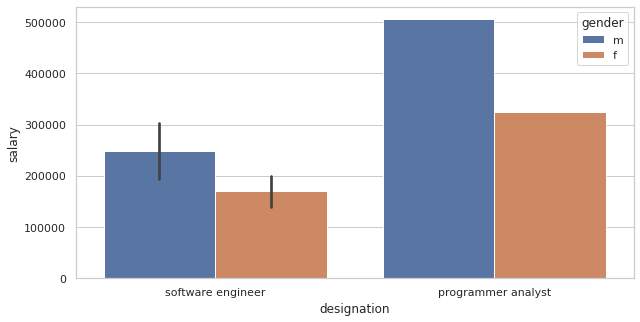

In [429]:
new=data[(data["designation"].isin(["programmer analyst","software engineer","hardware engineer","associate engineer"])) & (data["period"]==0)]
plt.figure(figsize=(10,5))
sns.barplot(x="designation",y="salary",hue="gender",data=new)

* For Freshers,the salary is starting from 200k and male are earing more than female as a fresher.

###**Feature Scaling**

In [430]:
clean_data=pd.DataFrame()
clean_data=data[data['computerscience']>0]

In [431]:
clean_data.shape

(896, 35)

In [435]:
clean_data.columns

Index(['salary', 'doj', 'dol', 'designation', 'jobcity', 'gender',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'collegetier', 'degree', 'specialization', 'collegegpa',
       'collegecitytier', 'collegestate', 'graduationyear', 'english',
       'logical', 'quant', 'domain', 'computerprogramming',
       'electronicsandsemicon', 'computerscience', 'mechanicalengg',
       'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience',
       'period'],
      dtype='object')

In [433]:
clean_data['specialization'].unique()

array(['ECE', 'CSE', 'EC', 'CA', 'IT', 'ECS', 'CS', 'EEE', 'ME', 'other'],
      dtype=object)

In [437]:
clean_data.drop(columns=['doj', 'dol', 'designation', 'jobcity','collegetier',  
       'collegecitytier', '10board','collegestate','electronicsandsemicon','mechanicalengg',
       'electricalengg', 'telecomengg', 'civilengg'],axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [438]:
clean_data.columns

Index(['salary', 'gender', '10percentage', '12graduation', '12percentage',
       '12board', 'degree', 'specialization', 'collegegpa', 'graduationyear',
       'english', 'logical', 'quant', 'domain', 'computerprogramming',
       'computerscience', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience', 'period'],
      dtype='object')

In [439]:
clean_data.to_csv('partial_clean_data.csv', index=False) #data without one hot encoding. for visualization purposes

One hot encoding the categorical columns

In [452]:
category_list=[ 'gender', '12board', 'degree','specialization']

In [453]:
for feature in category_list:
    clean_data = pd.get_dummies(clean_data, prefix=feature, columns=[feature])

Categorizing the salary to 5 categories

In [454]:
from sklearn import preprocessing
 
 
#set up bins
bin = [0,.25,.5,.75,1]

#use pd.cut function can attribute the values into its specific bins
category = pd.qcut(clean_data['salary'],bin)
category = category.to_frame()
category.columns = ['sal']

#concatenate age and its bin
y_cat = pd.concat([clean_data['salary'],category],axis = 1)

#labelencode
le = preprocessing.LabelEncoder()
le.fit(y_cat['sal'])
le.classes_
Y_train_cat=le.transform(y_cat['sal']) 

In [455]:
Y_train_cat

array([2, 2, 2, 2, 3, 3, 1, 3, 0, 1, 0, 3, 1, 3, 2, 2, 2, 1, 0, 2, 2, 1,
       2, 2, 0, 2, 2, 3, 0, 3, 0, 2, 1, 0, 1, 0, 0, 0, 1, 2, 0, 2, 2, 1,
       1, 3, 0, 2, 2, 1, 3, 0, 1, 0, 2, 0, 2, 2, 0, 2, 3, 0, 2, 2, 0, 2,
       2, 3, 1, 2, 2, 2, 3, 0, 0, 1, 0, 2, 2, 1, 1, 1, 1, 0, 3, 0, 0, 1,
       3, 1, 2, 3, 2, 2, 3, 0, 2, 0, 2, 2, 2, 0, 3, 0, 3, 3, 3, 0, 1, 2,
       0, 1, 0, 0, 2, 1, 1, 3, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 1, 2, 3,
       3, 3, 3, 2, 2, 3, 0, 2, 1, 2, 0, 2, 2, 0, 1, 1, 3, 0, 0, 0, 0, 0,
       3, 2, 0, 2, 0, 2, 2, 2, 3, 2, 2, 0, 1, 1, 3, 0, 1, 2, 1, 2, 3, 2,
       3, 0, 2, 3, 1, 2, 1, 0, 3, 0, 0, 2, 0, 2, 0, 0, 1, 0, 2, 0, 0, 1,
       2, 3, 0, 1, 2, 3, 2, 0, 3, 1, 2, 0, 3, 3, 3, 3, 3, 2, 3, 0, 2, 0,
       2, 0, 2, 1, 3, 2, 3, 3, 3, 3, 0, 2, 0, 1, 0, 3, 3, 2, 3, 0, 0, 0,
       2, 3, 3, 0, 0, 1, 0, 2, 3, 0, 3, 1, 2, 0, 2, 0, 0, 0, 0, 3, 2, 0,
       3, 1, 1, 2, 0, 3, 1, 0, 2, 3, 2, 0, 0, 0, 1, 3, 2, 0, 3, 0, 1, 3,
       3, 3, 3, 0, 0, 1, 3, 1, 0, 3, 1, 0, 2, 3, 2,

In [456]:
X_train=pd.DataFrame(clean_data.drop(columns=['salary'],axis=1))
Y_train=pd.DataFrame(clean_data['salary'])
Y_train_cat=pd.DataFrame(Y_train_cat)
print(X_train.shape,Y_train.shape,Y_train_cat.shape)

(896, 36) (896, 1) (896, 1)
